In [39]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Accuracy: 1.0

Results:
Cars296.png: License Plate Detected


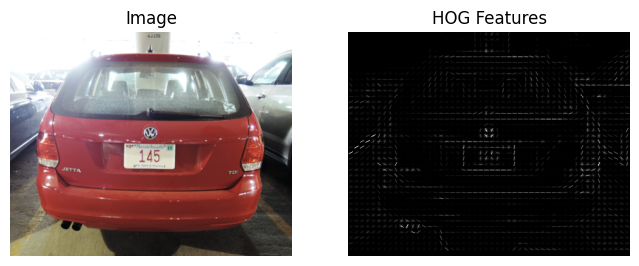

Cars75.png: License Plate Detected


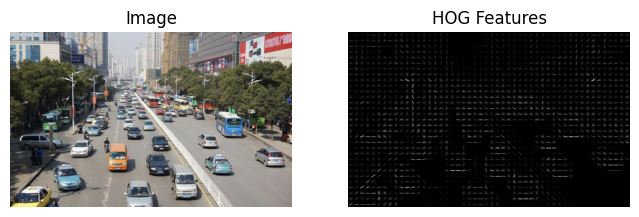

Cars110.png: License Plate Detected


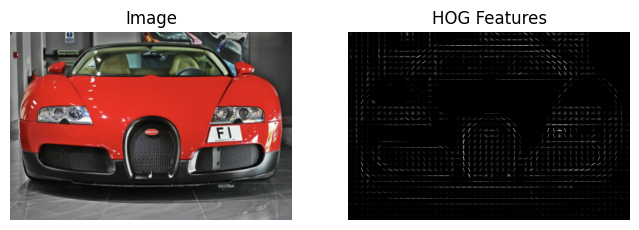

Cars258.png: License Plate Detected


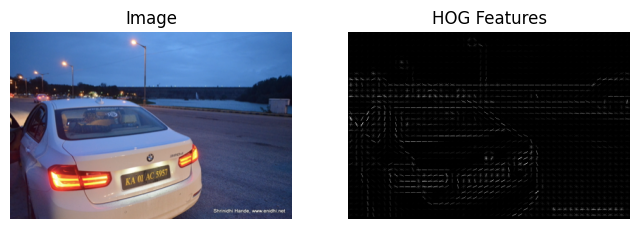

Cars325.png: License Plate Detected


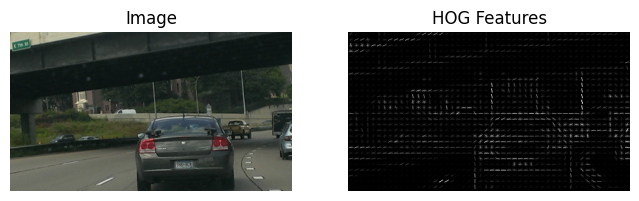

Cars322.png: License Plate Detected


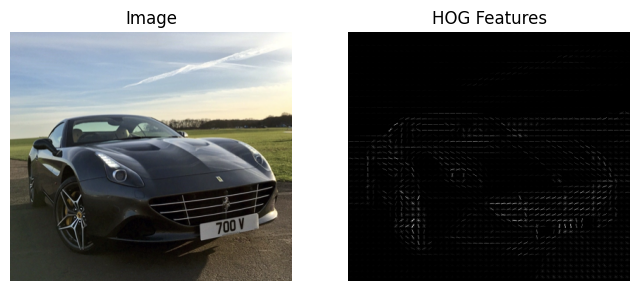

Cars285.png: License Plate Detected


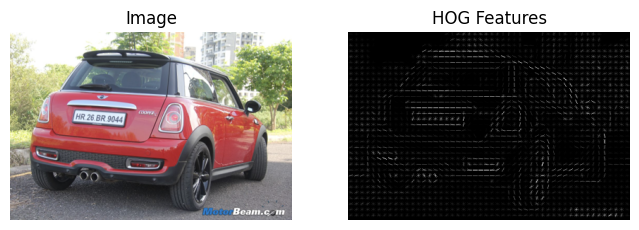

Cars79.png: License Plate Detected


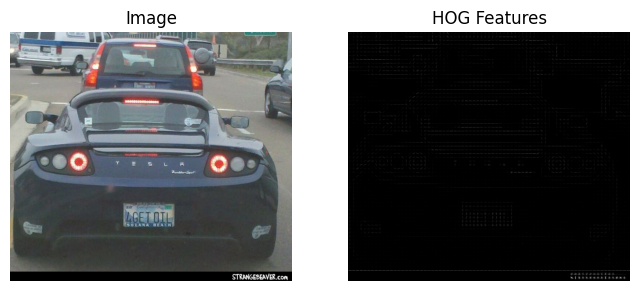

Cars352.png: License Plate Detected


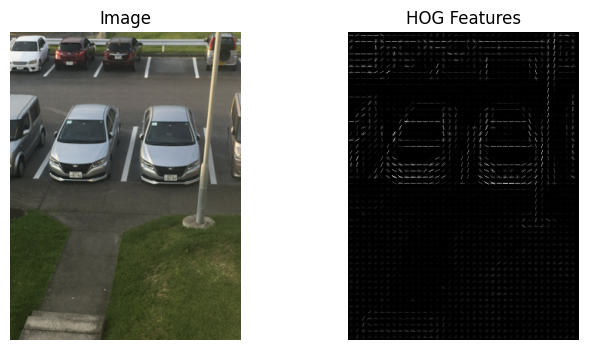

Cars421.png: License Plate Detected


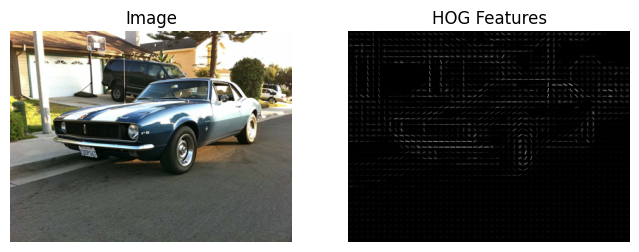

Cars388.png: License Plate Detected


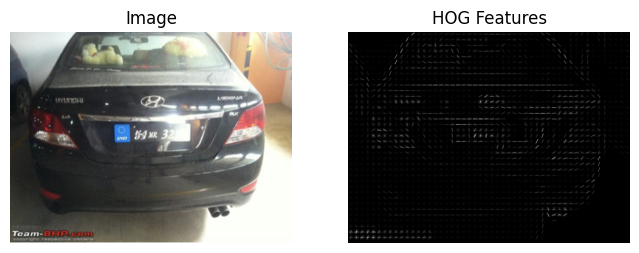

Cars72.png: License Plate Detected


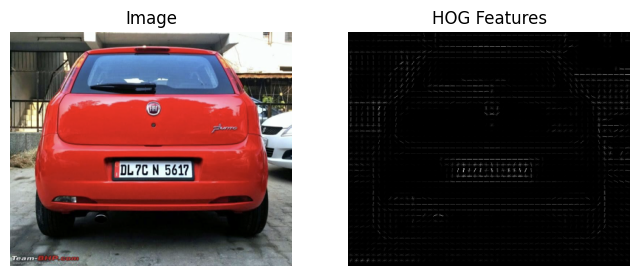

Cars432.png: License Plate Detected


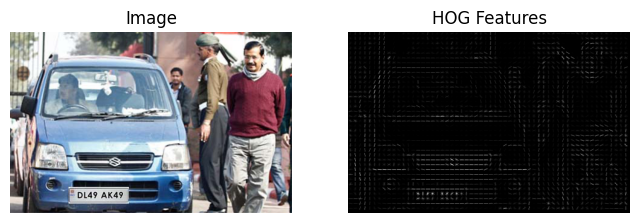

Cars375.png: License Plate Detected


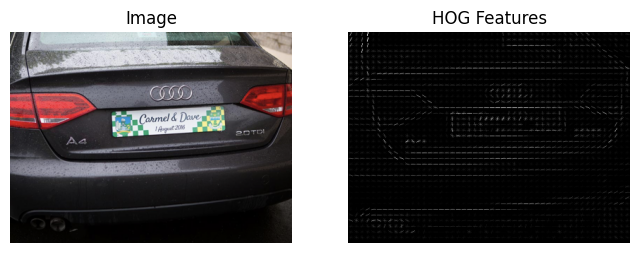

Cars125.png: License Plate Detected


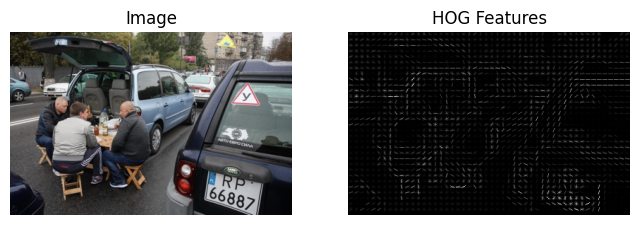

Cars73.png: License Plate Detected


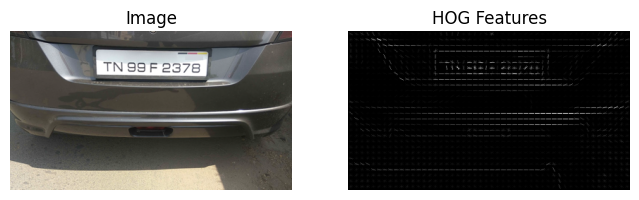

Cars427.png: License Plate Detected


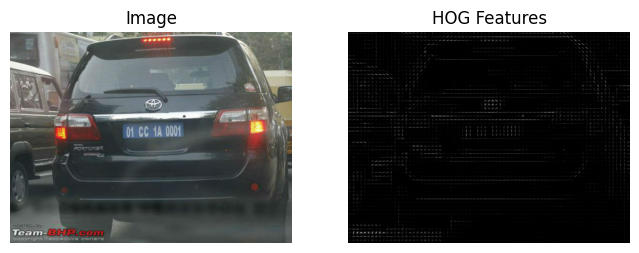

Cars89.png: License Plate Detected


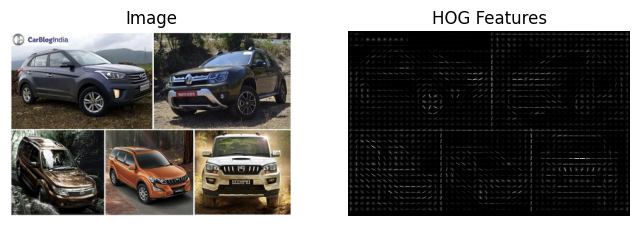

Cars80.png: License Plate Detected


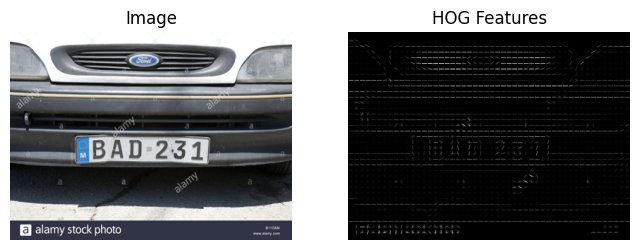

Cars406.png: License Plate Detected


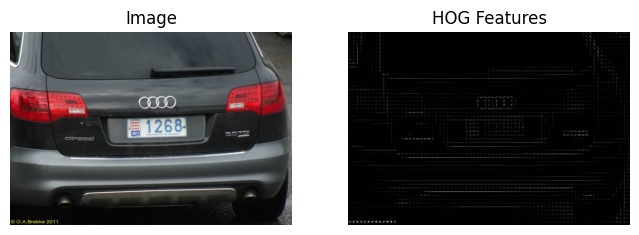

Cars13.png: License Plate Detected


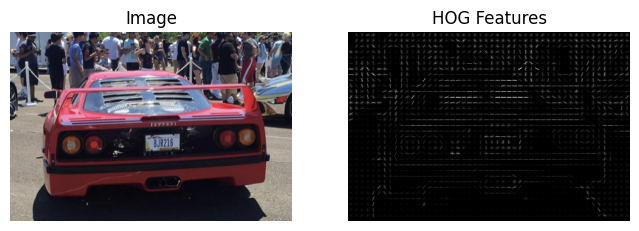

Cars372.png: License Plate Detected


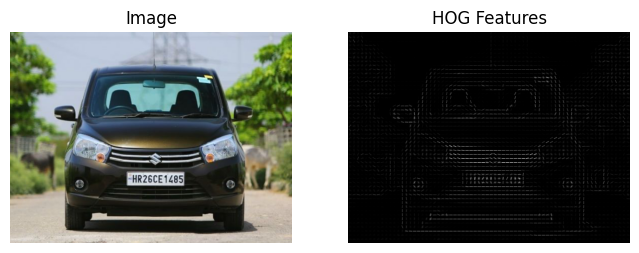

Cars33.png: License Plate Detected


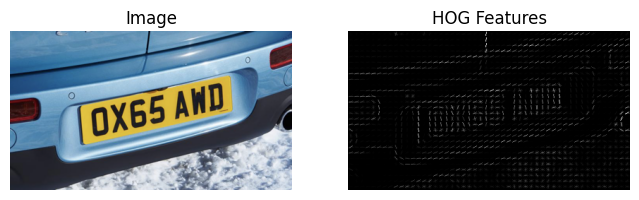

Cars357.png: License Plate Detected


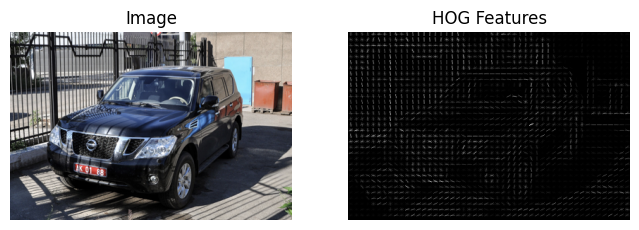

Cars140.png: License Plate Detected


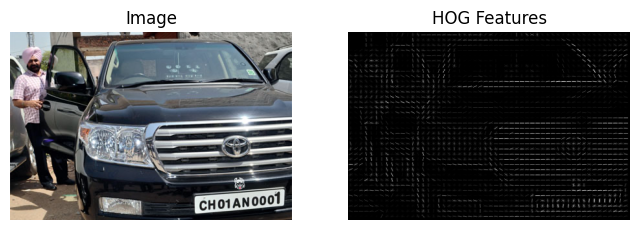

Cars312.png: License Plate Detected


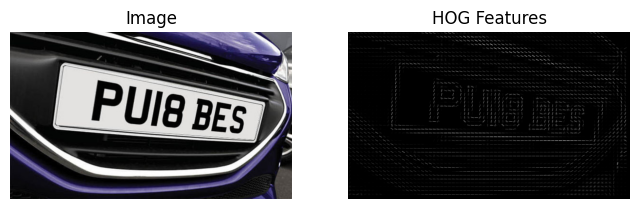

Cars82.png: License Plate Detected


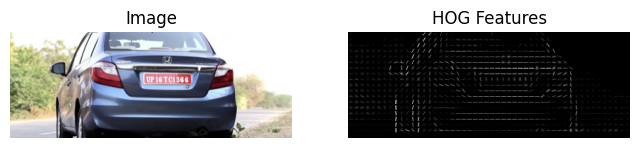

Cars396.png: License Plate Detected


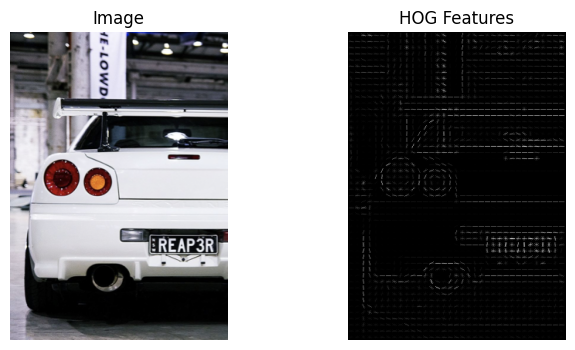

Cars401.png: License Plate Detected


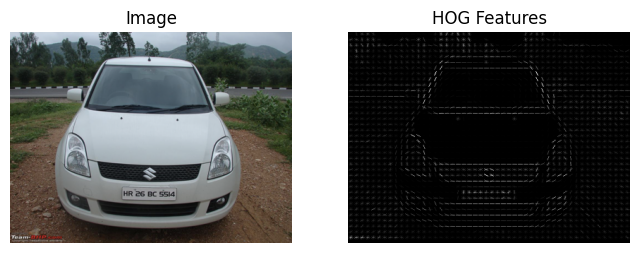

Cars50.png: License Plate Detected


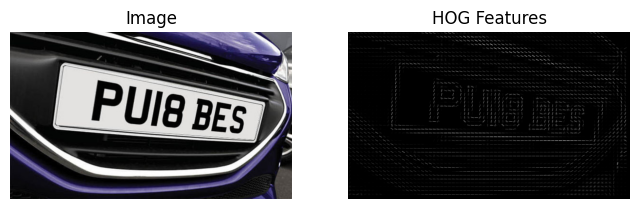

Cars141.png: License Plate Detected


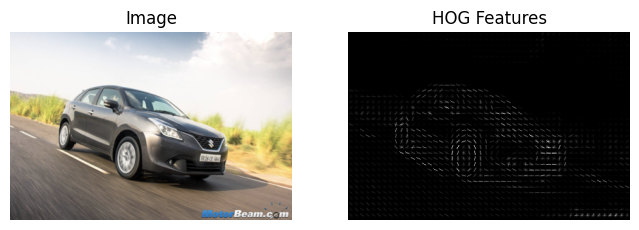

Cars213.png: License Plate Detected


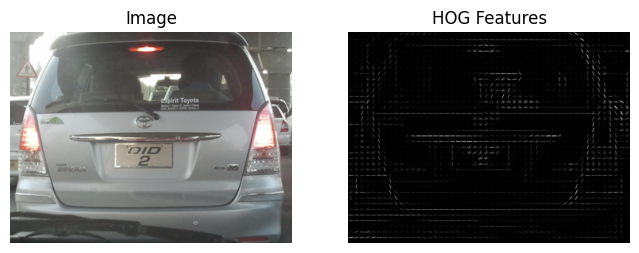

Cars107.png: License Plate Detected


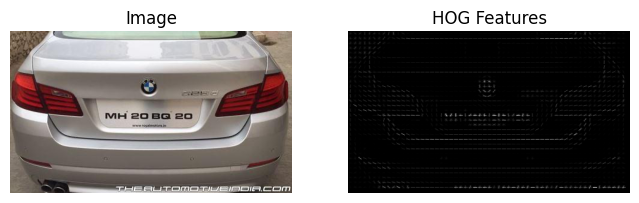

Cars379.png: License Plate Detected


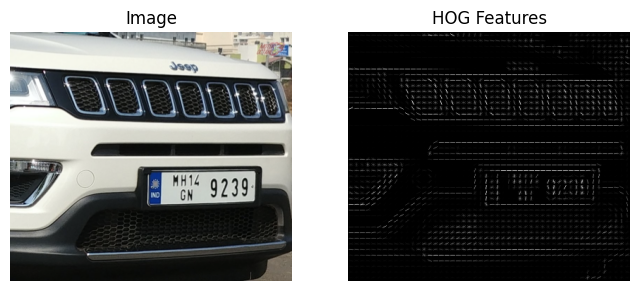

Cars119.png: License Plate Detected


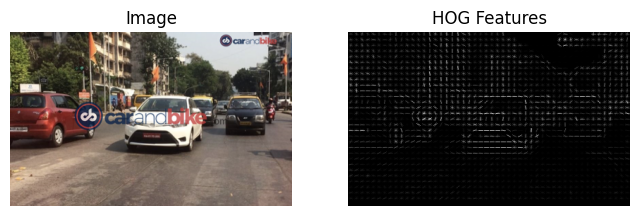

Cars70.png: License Plate Detected


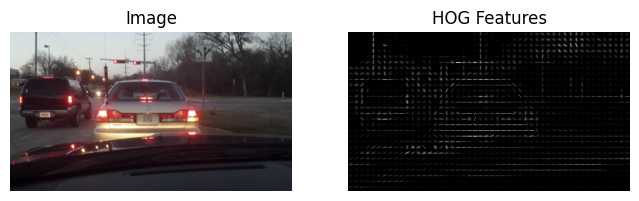

Cars222.png: License Plate Detected


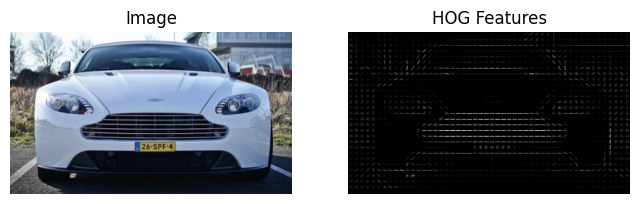

Cars251.png: License Plate Detected


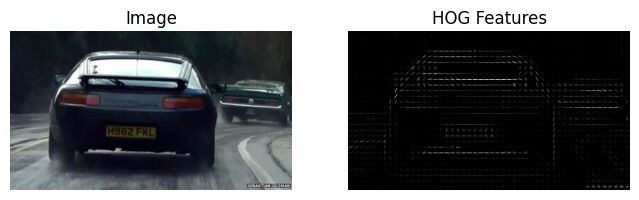

Cars24.png: License Plate Detected


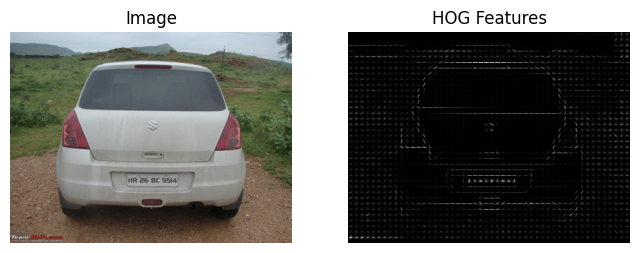

Cars154.png: License Plate Detected


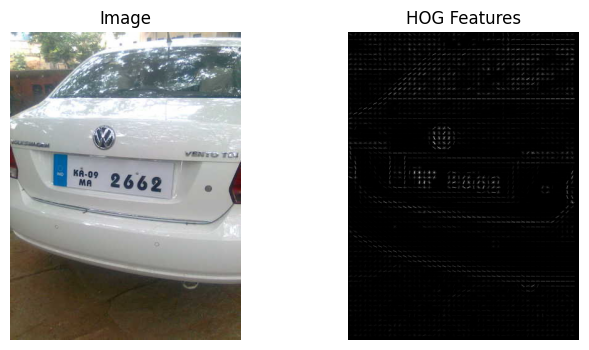

Cars334.png: License Plate Detected


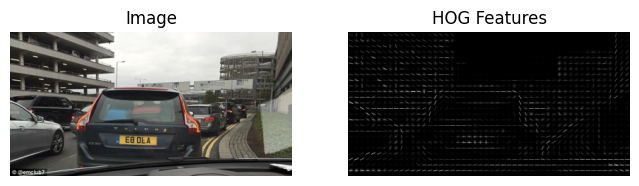

Cars276.png: License Plate Detected


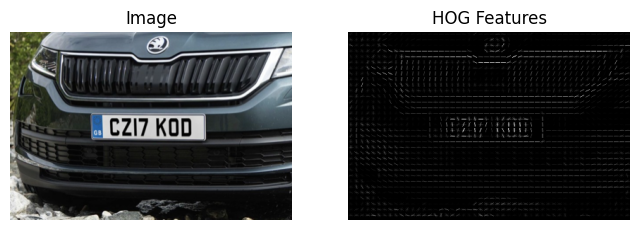

Cars272.png: License Plate Detected


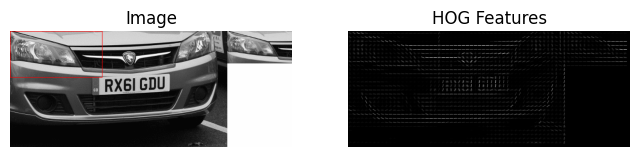

Cars76.png: License Plate Detected


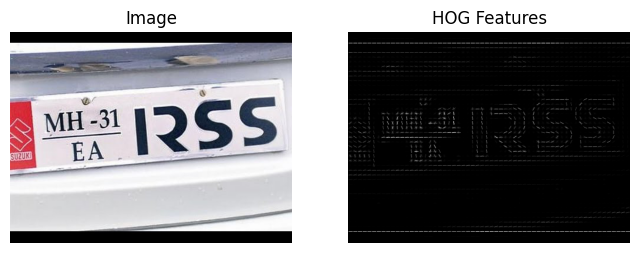

Cars142.png: License Plate Detected


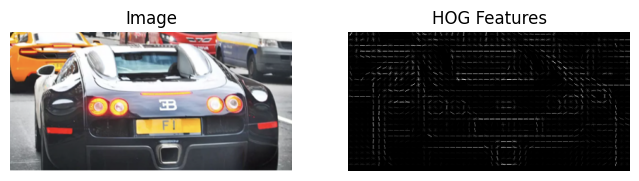

Cars30.png: License Plate Detected


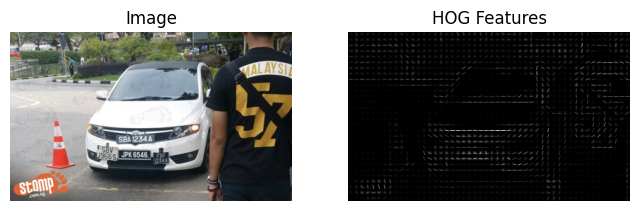

Cars121.png: License Plate Detected


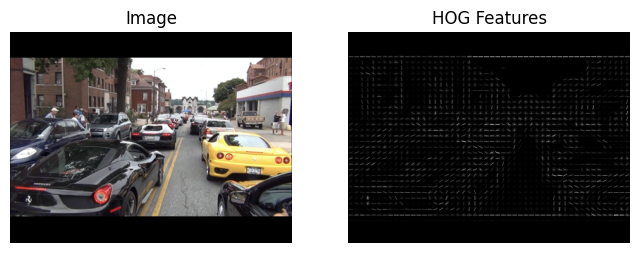

Cars305.png: License Plate Detected


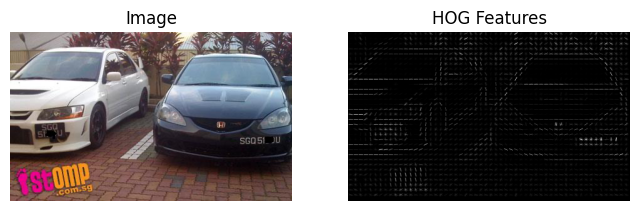

Cars74.png: License Plate Detected


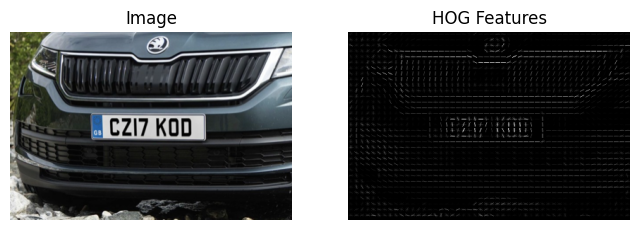

Cars245.png: License Plate Detected


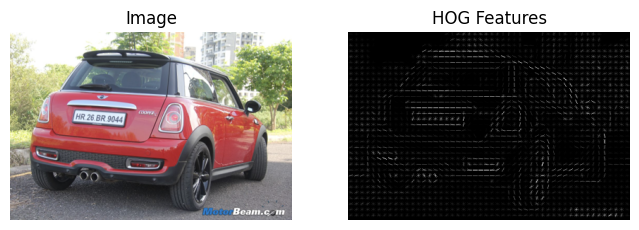

Cars386.png: License Plate Detected


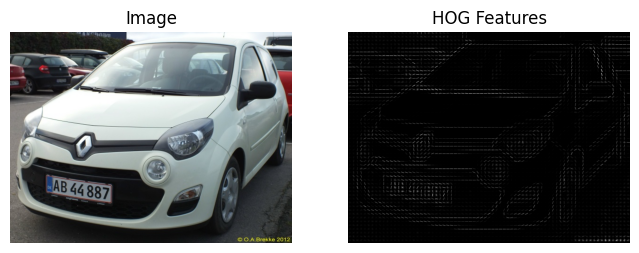

Cars7.png: License Plate Detected


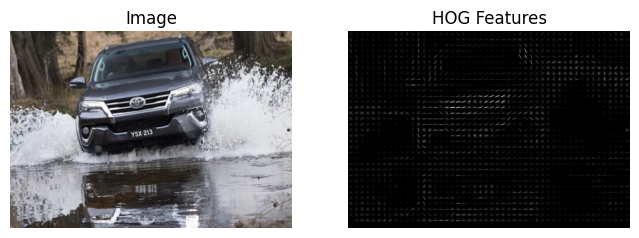

Cars162.png: License Plate Detected


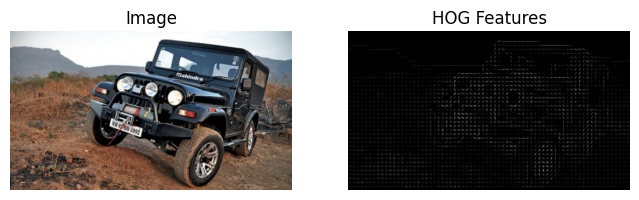

Cars267.png: License Plate Detected


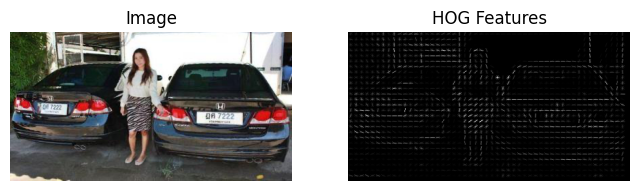

Cars0.png: License Plate Detected


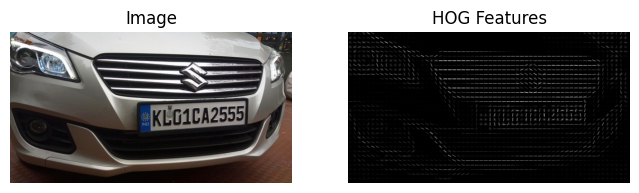

Cars3.png: License Plate Detected


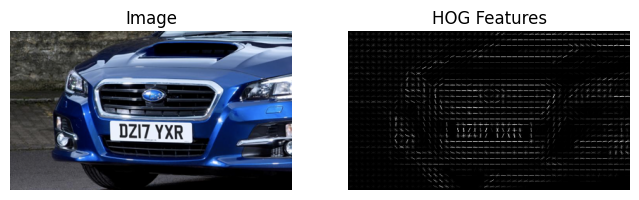

Cars420.png: License Plate Detected


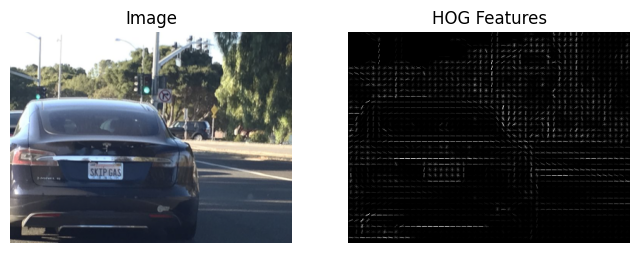

Cars289.png: License Plate Detected


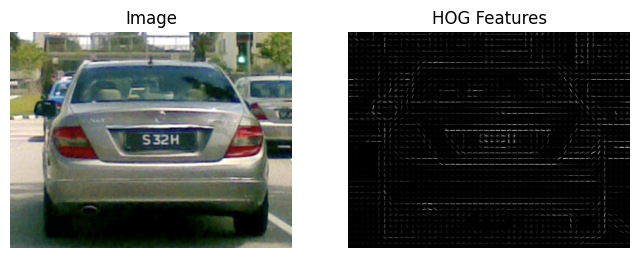

Cars49.png: License Plate Detected


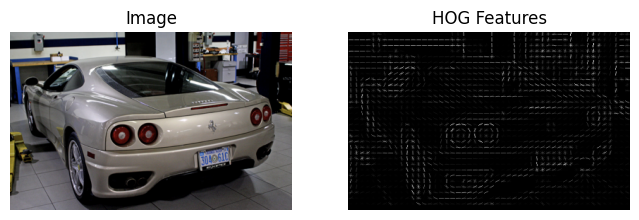

Cars161.png: License Plate Detected


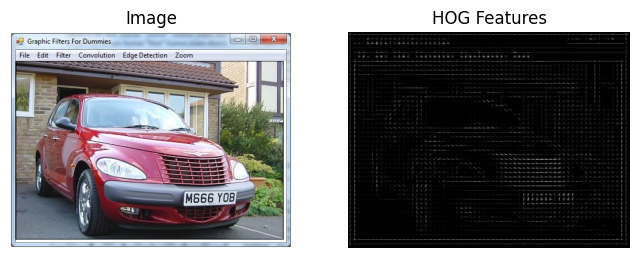

Cars192.png: License Plate Detected


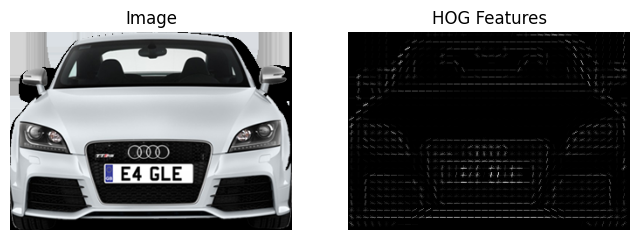

Cars93.png: License Plate Detected


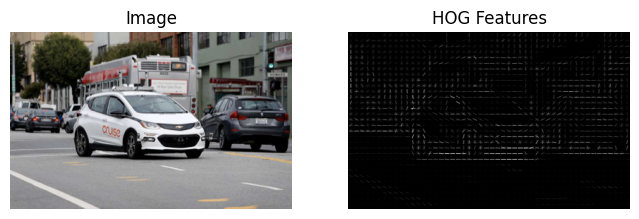

Cars291.png: License Plate Detected


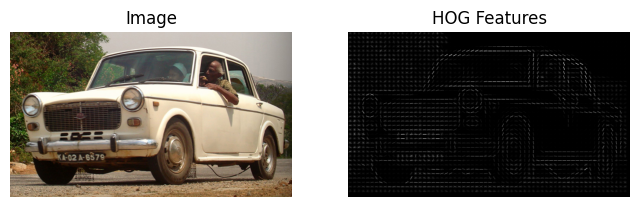

Cars387.png: License Plate Detected


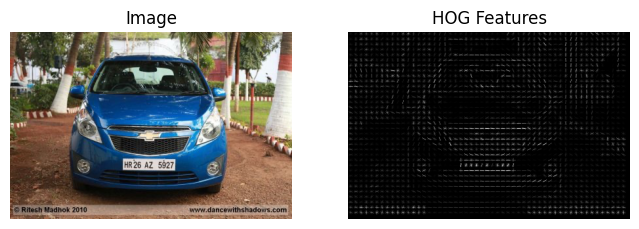

Cars364.png: License Plate Detected


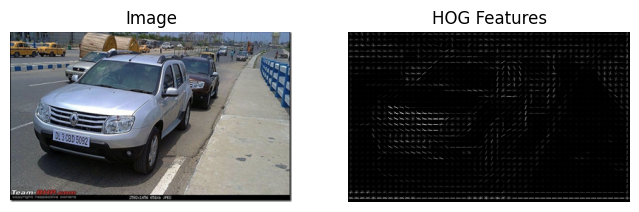

Cars398.png: License Plate Detected


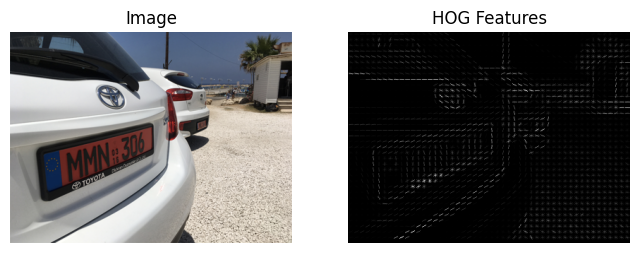

Cars38.png: License Plate Detected


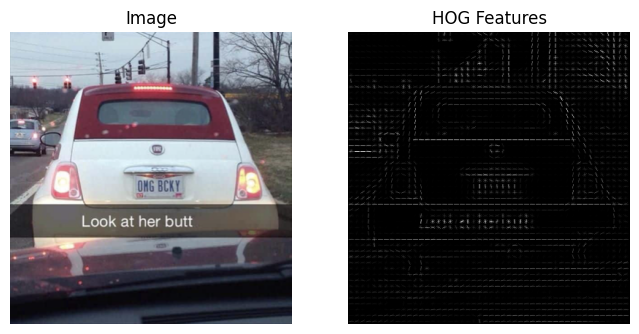

Cars307.png: License Plate Detected


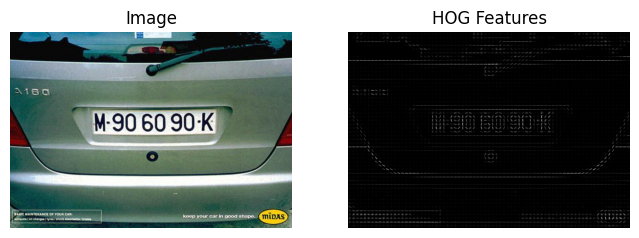

Cars206.png: License Plate Detected


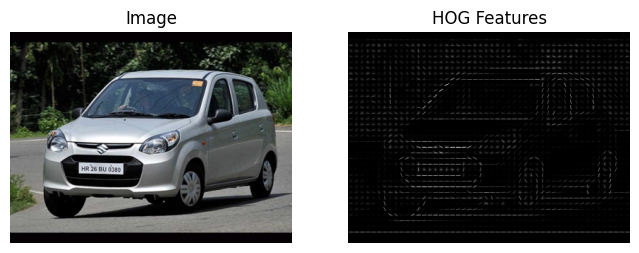

Cars143.png: License Plate Detected


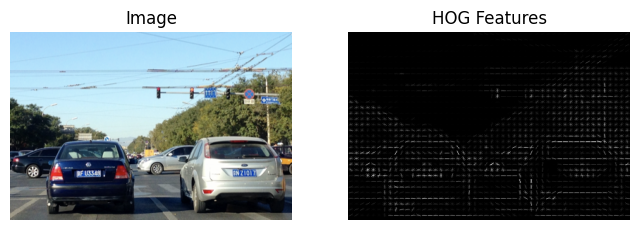

Cars63.png: License Plate Detected


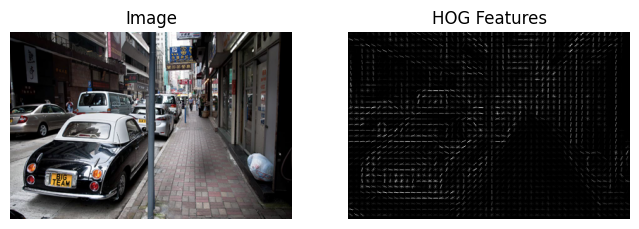

Cars394.png: License Plate Detected


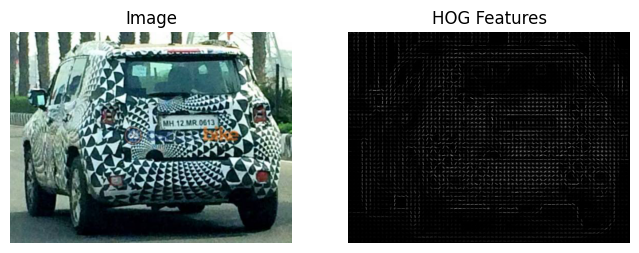

Cars384.png: License Plate Detected


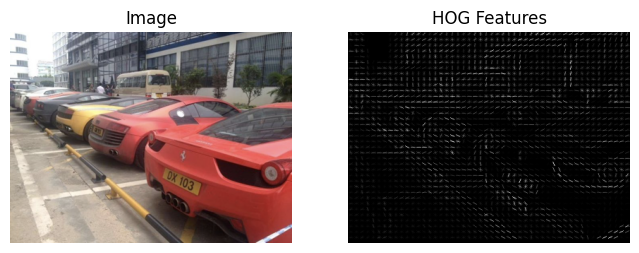

Cars426.png: License Plate Detected


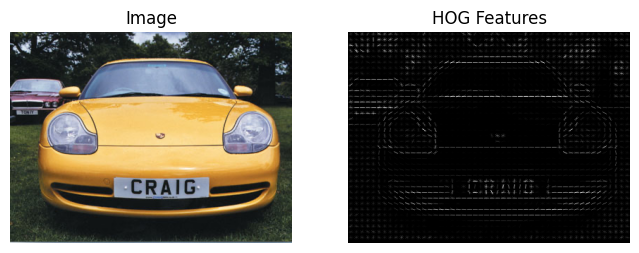

Cars287.png: License Plate Detected


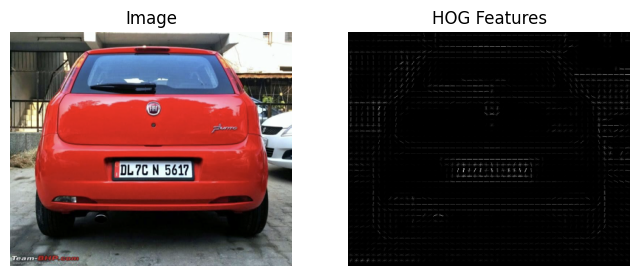

Cars200.png: License Plate Detected


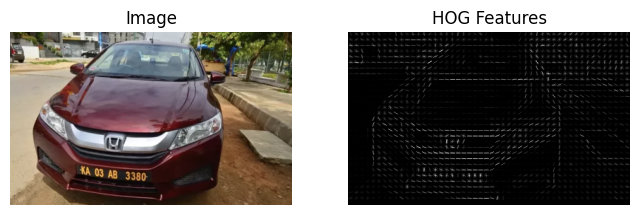

Cars295.png: License Plate Detected


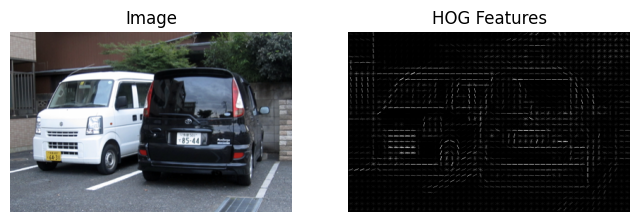

Cars41.png: License Plate Detected


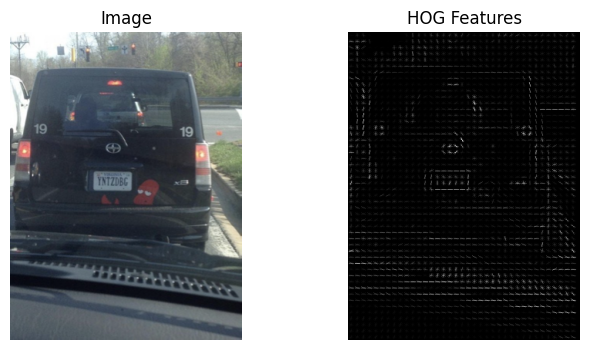

Cars59.png: License Plate Detected


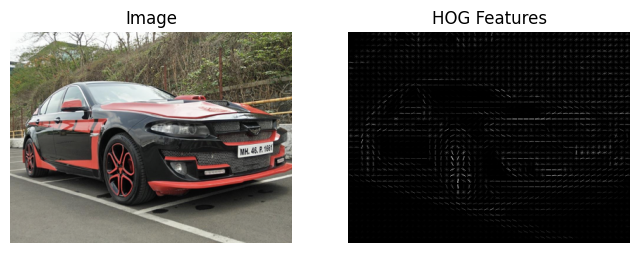

Cars96.png: License Plate Detected


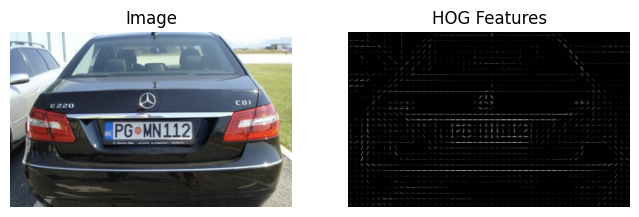

Cars410.png: License Plate Detected


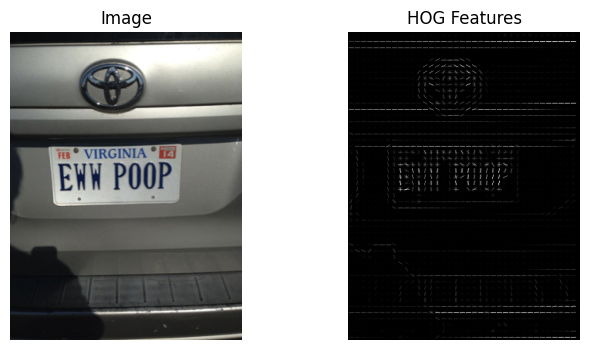

Cars413.png: License Plate Detected


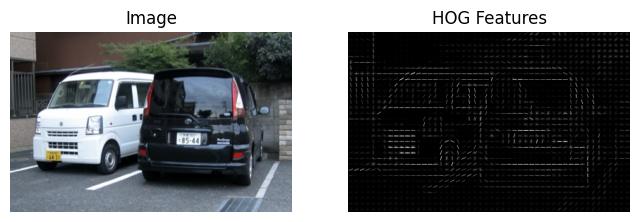

Cars400.png: License Plate Detected


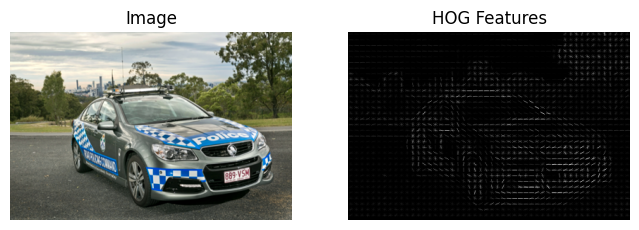

Cars48.png: License Plate Detected


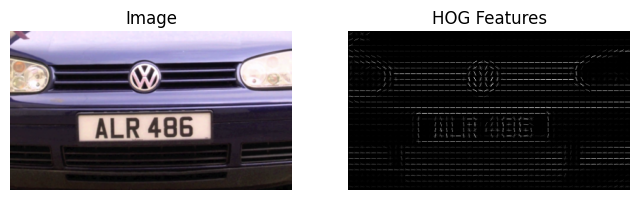

Cars130.png: License Plate Detected


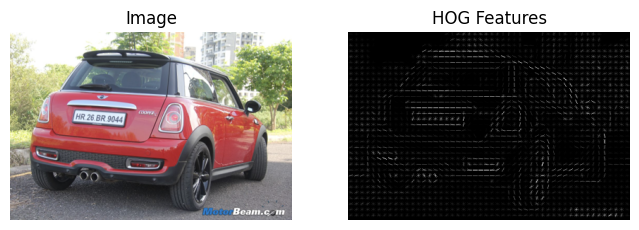

Cars39.png: License Plate Detected


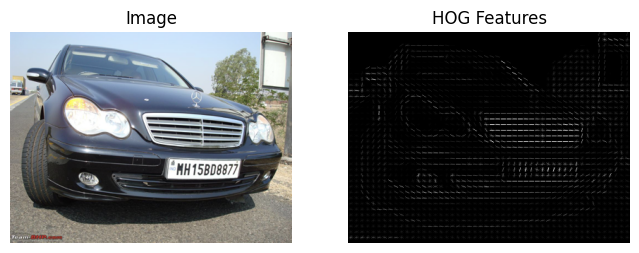

Cars5.png: License Plate Detected


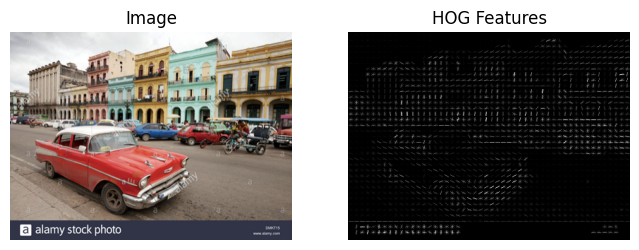

In [40]:
import os
import cv2
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from skimage.feature import hog # histogram of oriented gradients
import matplotlib.pyplot as plt

# Function to extract HOG features from an image and visualize them
def extract_features(image_path, visualize=False):
    image = cv2.imread(image_path) #reading the image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #converting to greyscale to simplify and reduce number of channels

    # Compute HOG features
    features, hog_image = hog(gray, orientations=9, pixels_per_cell=(8, 8),
                              cells_per_block=(2, 2), visualize=True, transform_sqrt=True)

    # Ensure all feature vectors have the same length (e.g., by padding or resizing)
    max_length = 5000  # Example: Set a maximum length for feature vectors
    if len(features) < max_length:
        features = np.pad(features, (0, max_length - len(features)), mode='constant')
    elif len(features) > max_length:
        features = features[:max_length]  # Trim if too long

    if visualize:
        # Visualize HOG features
        plt.figure(figsize=(8, 4))
        plt.subplot(121).set_title('Image')
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.subplot(122).set_title('HOG Features')
        plt.imshow(hog_image, cmap='gray')
        plt.axis('off')
        plt.show()

    return features

# Function to load dataset
def load_dataset(dataset_path):
    images = []
    labels = []
    image_files = []  # To store image file paths for result output
    # Example: iterate over your dataset folder and load images and labels
    for image_file in os.listdir(dataset_path):
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            image_path = os.path.join(dataset_path, image_file)
            xml_path = os.path.join(dataset_path, image_file.replace('.jpg', '.xml').replace('.png', '.xml'))

            if os.path.exists(xml_path) and os.stat(xml_path).st_size > 0:
                # Image with license plate
                labels.append(1)
            else:
                # Image without license plate
                labels.append(0)

            # Extract features for every image (with or without license plate)
            features = extract_features(image_path)
            images.append(features)
            image_files.append(image_file)  # Store image file path

    # Convert lists to numpy arrays
    images = np.array(images)
    labels = np.array(labels)

    return images, labels, image_files

# Example usage:
dataset_path = '/content/drive/MyDrive/BaselineModel/'
images, labels, image_files = load_dataset(dataset_path)

# Ensure you have a mix of labels (both 0s and 1s) in labels

# Split dataset into training and testing sets
X_train, X_test, y_train, y_test, train_files, test_files = train_test_split(images, labels, image_files, test_size=0.2, random_state=42)

# Initialize SVM classifier
svm_classifier = SVC(kernel='linear')

# Train SVM
svm_classifier.fit(X_train, y_train)

# Predict on test set and visualize results
y_pred = svm_classifier.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Output results with visualization
print("\nResults:")
for i in range(len(y_pred)):
    result = "License Plate Detected" if y_pred[i] == 1 else "No License Plate Detected"
    print(f"{test_files[i]}: {result}")
    # Visualize HOG features for the current image
    extract_features(os.path.join(dataset_path, test_files[i]), visualize=True)
